# CUSTOMER RETENTION DATASET

In [1]:
# Importing Liabraries amd models and metrics for analysis and model creation
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import Lasso,Ridge
import warnings
warnings.filterwarnings('ignore')
!pip install plot-likert
import plot_likert

In [2]:
#Setting option to show max rows and max columns
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows", None)
df=pd.read_excel("ecom.xls")
df

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [3]:
df.shape

(269, 71)

#the total data is having 269 rows and 71 columns

In [4]:
#cleaning data
from string import digits

#Removing tab spaces
df.columns = df.columns.str.replace('\t','')

#Removing digits
remove_digits = str.maketrans('', '', digits)
df.columns = df.columns.str.translate(remove_digits)

#Removing leading and trailling spaces
df.columns = df.columns.str.strip()

In [5]:
df.dtypes

Gender of respondent                                                                                         object
How old are you?                                                                                             object
Which city do you shop online from?                                                                          object
What is the Pin Code of where you shop online from?                                                           int64
Since How Long You are Shopping Online ?                                                                     object
How many times you have made an online purchase in the past  year?                                           object
How do you access the internet while shopping on-line?                                                       object
Which device do you use to access the online shopping?                                                       object
What is the screen size of your mobile device?                          

#the complete data is in object format

In [6]:
#Let's check the unique values
print("Distince values of each columns")
for column in df:
    print(f'-{column}:{df[column].unique()}')

Distince values of each columns
-Gender of respondent:['Male' 'Female']
-How old are you?:['31-40 years' '21-30 years' '41-50 yaers' 'Less than 20 years'
 '51 years and above']
-Which city do you shop online from?:['Delhi' 'Greater Noida' 'Karnal ' 'Bangalore ' 'Noida' 'Solan'
 'Moradabad' 'Gurgaon ' 'Merrut' 'Ghaziabad' 'Bulandshahr']
-What is the Pin Code of where you shop online from?:[110009 110030 201308 132001 530068 110011 110018 173229 110039 244001
 122018 201310 560037 203207 250001 201005 110044 201306 560010 201305
 110042 132036 560018 110008 560002 201303 201312 203202 560001 201304
 560003 110014 560013 173212 122009 201009 201008 201001 203001]
-Since How Long You are Shopping Online ?:['Above 4 years' '3-4 years' '2-3 years' 'Less than 1 year' '1-2 years']
-How many times you have made an online purchase in the past  year?:['31-40 times' '41 times and above' 'Less than 10 times' '11-20 times'
 '21-30 times' '42 times and above']
-How do you access the internet while sh

In [7]:
df.nunique()

Gender of respondent                                                                                          2
How old are you?                                                                                              5
Which city do you shop online from?                                                                          11
What is the Pin Code of where you shop online from?                                                          39
Since How Long You are Shopping Online ?                                                                      5
How many times you have made an online purchase in the past  year?                                            6
How do you access the internet while shopping on-line?                                                        4
Which device do you use to access the online shopping?                                                        4
What is the screen size of your mobile device?                                                          

In [8]:
df.head().T

,0,1,2,3,4
Gender of respondent,Male,Female,Female,Male,Female
How old are you?,31-40 years,21-30 years,21-30 years,21-30 years,21-30 years
Which city do you shop online from?,Delhi,Delhi,Greater Noida,Karnal,Bangalore
What is the Pin Code of where you shop online from?,110009,110030,201308,132001,530068
Since How Long You are Shopping Online ?,Above 4 years,Above 4 years,3-4 years,3-4 years,2-3 years
How many times you have made an online purchase in the past year?,31-40 times,41 times and above,41 times and above,Less than 10 times,11-20 times
How do you access the internet while shopping on-line?,Dial-up,Wi-Fi,Mobile Internet,Mobile Internet,Wi-Fi
Which device do you use to access the online shopping?,Desktop,Smartphone,Smartphone,Smartphone,Smartphone
What is the screen size of your mobile device?,Others,4.7 inches,5.5 inches,5.5 inches,4.7 inches
What is the operating system (OS) of your device?,Window/windows Mobile,IOS/Mac,Android,IOS/Mac,IOS/Mac


# EXPLORATORY DATA ANALYSIS

In [9]:
#Let's check the null value- No null Value found
df.isnull().sum()

Gender of respondent                                                                                         0
How old are you?                                                                                             0
Which city do you shop online from?                                                                          0
What is the Pin Code of where you shop online from?                                                          0
Since How Long You are Shopping Online ?                                                                     0
How many times you have made an online purchase in the past  year?                                           0
How do you access the internet while shopping on-line?                                                       0
Which device do you use to access the online shopping?                                                       0
What is the screen size of your mobile device?                                                               0
W

<AxesSubplot:>

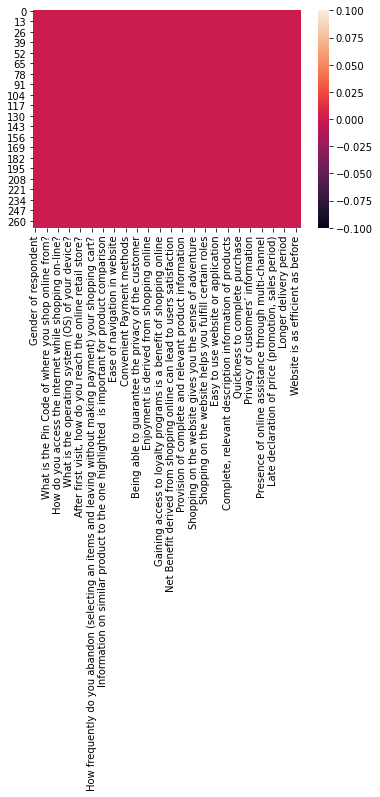

In [10]:
sns.heatmap(df.isnull())

In [11]:
df.describe()

,What is the Pin Code of where you shop online from?
count,269.000000
mean,220465.747212
std,140524.341051
min,110008.000000
25%,122018.000000
50%,201303.000000
75%,201310.000000
max,560037.000000


Text(0.5, 1.0, 'Preference of gender in shopping')

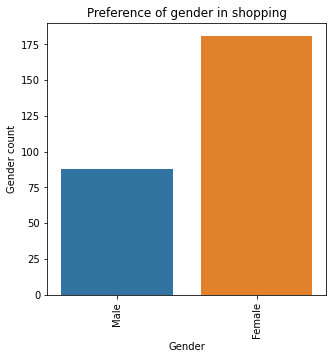

In [12]:
plt.figure(figsize=(5,5))
sns.countplot(x="Gender of respondent",data=df)
plt.xticks(rotation = 90)
plt.xlabel("Gender")
plt.ylabel("Gender count")
plt.title('Preference of gender in shopping')

We can see that the in online shopping involvement of women are more in comparision to men. By looking we can say that the women are almost double in numbers

Text(0.5, 1.0, 'Age group shopping preference')

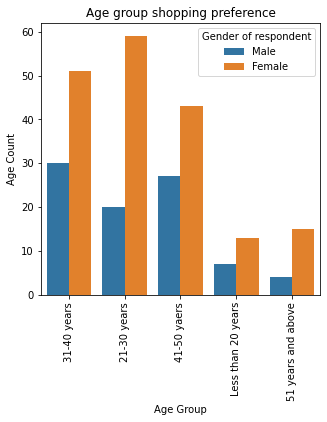

In [13]:
plt.figure(figsize=(5,5))
sns.countplot(x="How old are you?",data=df,hue=df["Gender of respondent"])
plt.xticks(rotation = 90)
plt.xlabel("Age Group")
plt.ylabel("Age Count")
plt.title('Age group shopping preference')

The age group of 31-40 is involved more in online shopping in comparision of other age group. The female belong to age group of 21-30 prefer more to shopping whille men age group of 31-40 prefer to shopping 

Text(0.5, 1.0, 'Preference of gender city wise in shopping')

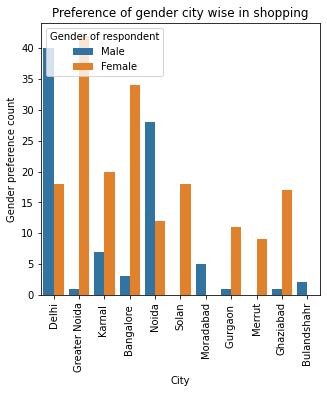

In [14]:
plt.figure(figsize=(5,5))
sns.countplot(x="Which city do you shop online from?",data=df,hue=df["Gender of respondent"])
plt.xticks(rotation = 90)
plt.xlabel("City")
plt.ylabel("Gender preference count")
plt.title('Preference of gender city wise in shopping')

Men from Delhi and Women greater noida prefer shopping. So we can say that shopping sites get more business from these locations. 

Text(0.5, 1.0, 'Preference of gender wise preference in shopping')

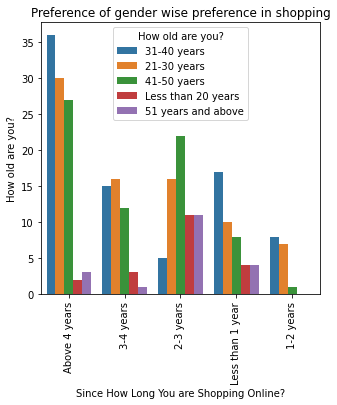

In [15]:
plt.figure(figsize=(5,5))
sns.countplot(x="Since How Long You are Shopping Online ?",data=df,hue=df["How old are you?"])
plt.xticks(rotation = 90)
plt.xlabel("Since How Long You are Shopping Online?")
plt.ylabel("How old are you?")
plt.title('Preference of gender wise preference in shopping')

#Age group of 31-40 are long assoiactes/Buyers from the online shopping websites. 

In [16]:
df["How many times you have made an online purchase in the past  year?"].replace('42 times and above','41 times and above',inplace=True)

In [17]:
df["How many times you have made an online purchase in the past  year?"].unique()

array(['31-40 times', '41 times and above', 'Less than 10 times',
       '11-20 times', '21-30 times'], dtype=object)

Text(0.5, 1.0, 'Shooping Details')

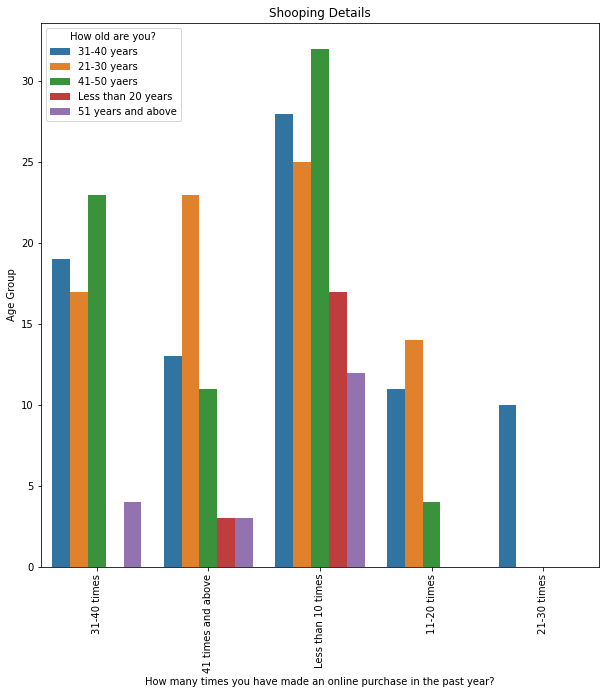

In [18]:
plt.figure(figsize=(10,10))
sns.countplot(x="How many times you have made an online purchase in the past  year?",data=df,hue=df["How old are you?"])
plt.xticks(rotation = 90)
plt.xlabel("How many times you have made an online purchase in the past year?")
plt.ylabel("Age Group")
plt.title("Shooping Details")

mostly peolpe from all age group has done shopping less than 10 times a year

Text(0.5, 1.0, '123')

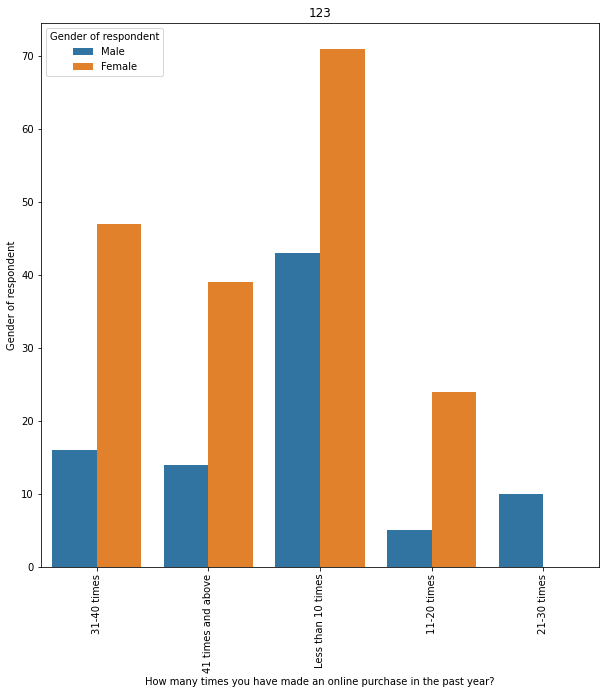

In [19]:
plt.figure(figsize=(10,10))
sns.countplot(x="How many times you have made an online purchase in the past  year?",data=df,hue=df["Gender of respondent"])
plt.xticks(rotation = 90)
plt.xlabel("How many times you have made an online purchase in the past year?")
plt.ylabel("Gender of respondent")
plt.title("123")

Text(0.5, 1.0, '123')

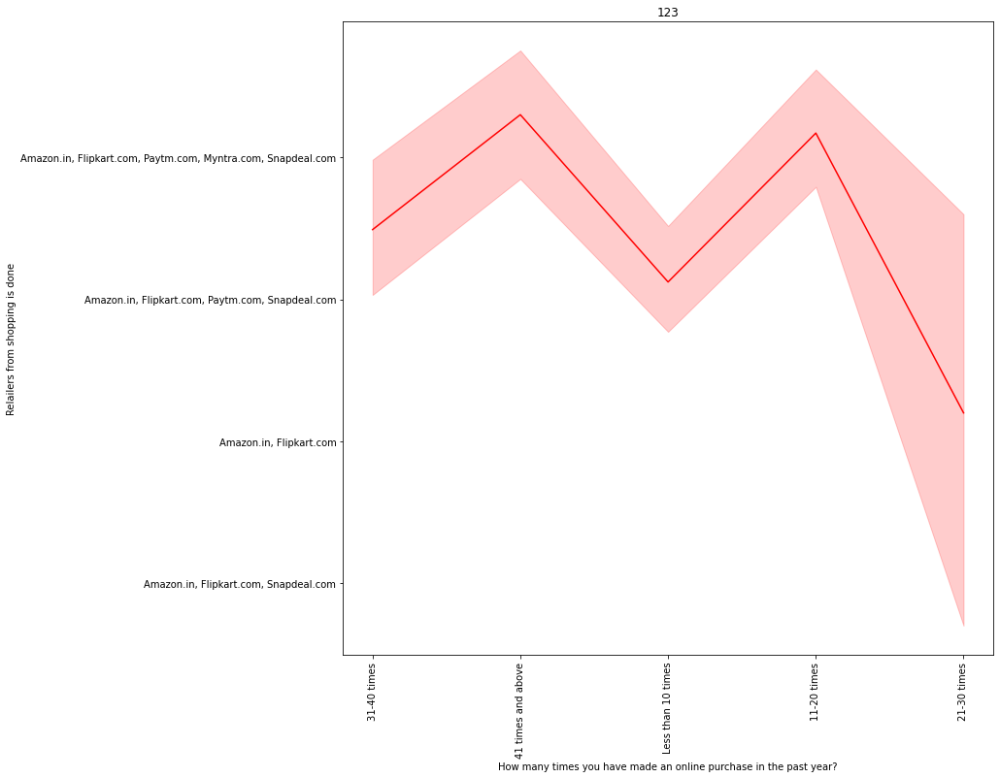

In [20]:
plt.figure(figsize=(12,12))
sns.lineplot(x=df["How many times you have made an online purchase in the past  year?"], y=df['From the following, tick any (or all) of the online retailers you have shopped from;'],color="Red")
plt.xticks(rotation = 90)
plt.xlabel("How many times you have made an online purchase in the past year?")
plt.ylabel("Relailers from shopping is done")
plt.title("123")

We can see that Myntra anf dlipkart are the morst preferred brand for online shopping by customers

In [21]:
df['How many times you have made an online purchase in the past  year?']=df['How many times you have made an online purchase in the past  year?'].replace({'31-40 times':35,'41 times and above':45,'Less than 10 times':5,'11-20 times':15,'21-30 times':25})

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Amazon.in, Paytm.com'),
  Text(1, 0, 'Amazon.in, Flipkart.com, Myntra.com, Snapdeal.com'),
  Text(2, 0, 'Amazon.in, Paytm.com, Myntra.com'),
  Text(3, 0, 'Amazon.in, Flipkart.com, Paytm.com, Myntra.com, Snapdeal.com'),
  Text(4, 0, 'Amazon.in, Flipkart.com, Paytm.com, Snapdeal.com'),
  Text(5, 0, 'Amazon.in, Flipkart.com'),
  Text(6, 0, 'Amazon.in, Flipkart.com, Snapdeal.com'),
  Text(7, 0, 'Amazon.in'),
  Text(8, 0, 'Amazon.in, Flipkart.com, Paytm.com')])

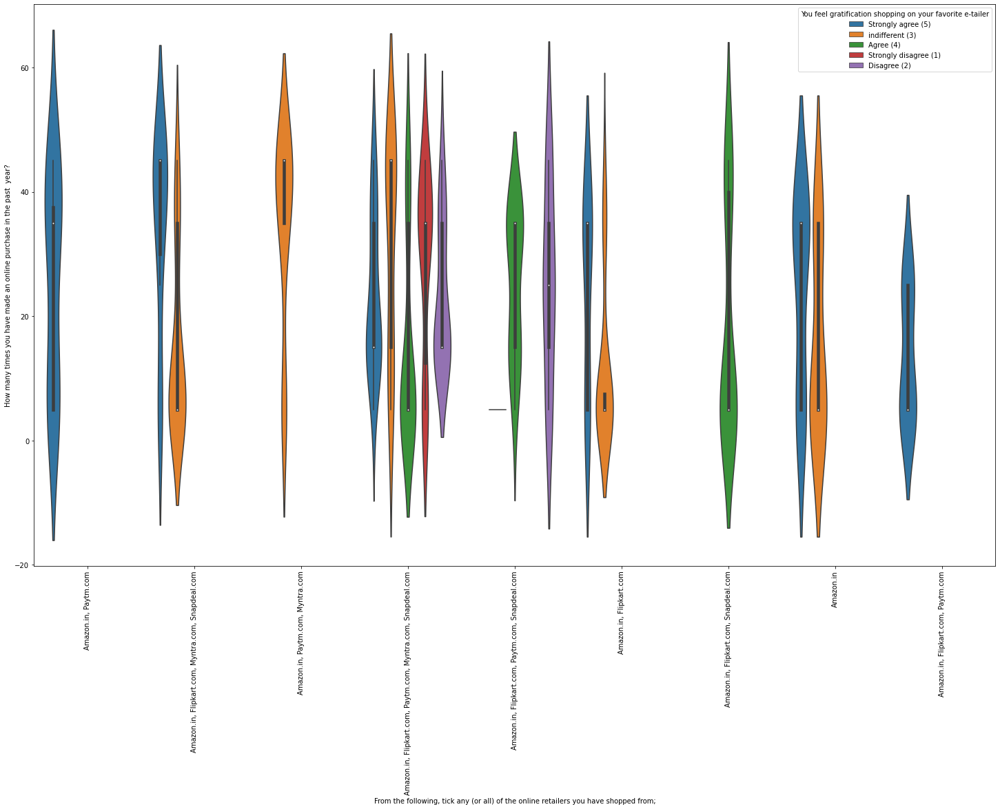

In [22]:
plt.figure(figsize=(25,15))
sns.violinplot(x=df['From the following, tick any (or all) of the online retailers you have shopped from;'],
               y=df['How many times you have made an online purchase in the past  year?'],hue=df['You feel gratification shopping on your favorite e-tailer'])
plt.xticks(rotation=90)

Almost all the people who have shopped from amazon, flipkart and paytm are satisfied. People who shop from a more number of online brands dosent seem to be satisfied.

In [23]:
Data=['How do you access the internet while shopping on-line?','Which device do you use to access the online shopping?','What is the screen size of your mobile device?',
               'What is the operating system (OS) of your device?','What browser do you run on your device to access the website?',
                   'Which channel did you follow to arrive at your favorite online store for the first time?',"After first visit, how do you reach the online retail store?"]

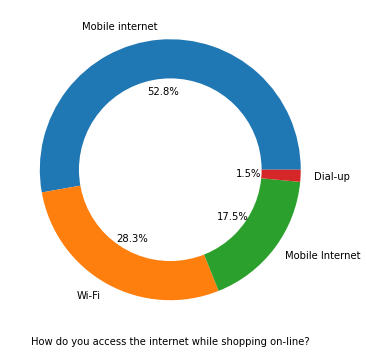

<Figure size 432x288 with 0 Axes>

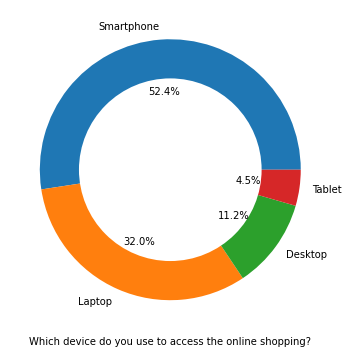

<Figure size 432x288 with 0 Axes>

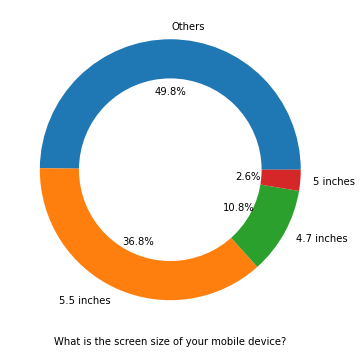

<Figure size 432x288 with 0 Axes>

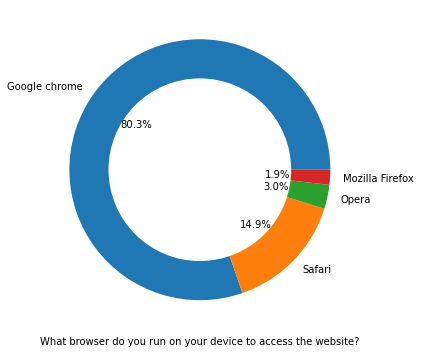

<Figure size 432x288 with 0 Axes>

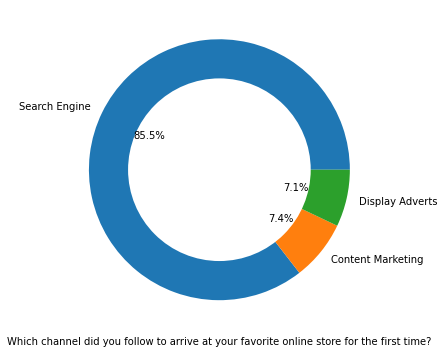

<Figure size 432x288 with 0 Axes>

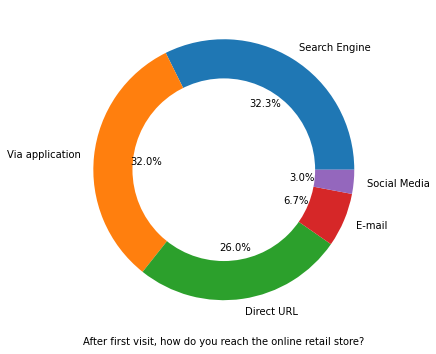

<Figure size 432x288 with 0 Axes>

In [24]:
for i in Data:
    if i!='What is the operating system (OS) of your device?':
        plt.figure(figsize=(8,6))
        df[i].value_counts().plot.pie(autopct='%1.1f%%')
        centre=plt.Circle((0,0),0.7,fc='white')
        fig=plt.gcf()
        fig.gca().add_artist(centre)
        plt.xlabel(i)
        plt.ylabel('')
        plt.figure()

People mostly prefer mobile internet (52.8%) followed by wifi (28%in comparison to any other medium of connectivety.
People use Mobile phone mostly for the shopping (52%). the least one is tablet (4.5%). 
Mostly buyers have 5.5 inches of mobile phones which is preferly used in online shopping.
google chrome is the mostly preferred and convenient browser than any other. 
People come to now about their preferred shopping site through Search Engines like google and others. 

<AxesSubplot:xlabel='How much time do you explore the e- retail store before making a purchase decision?', ylabel='count'>

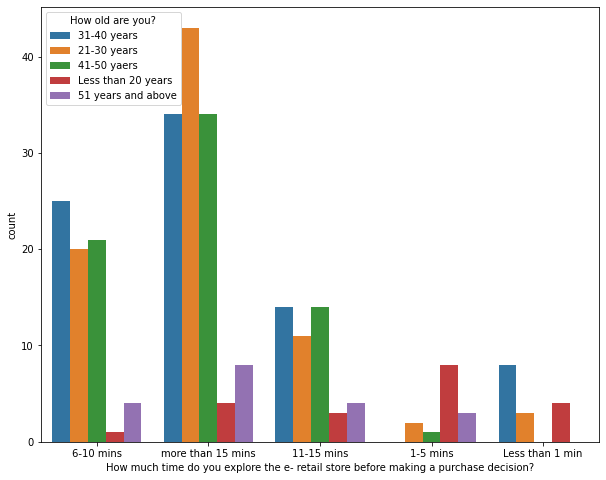

In [25]:
plt.figure(figsize=(10,8))
sns.countplot(df['How much time do you explore the e- retail store before making a purchase decision?'],hue=df['How old are you?'])

People from all age group prefer to spend more then 15 minutes to finalize the product

<AxesSubplot:xlabel='How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?', ylabel='count'>

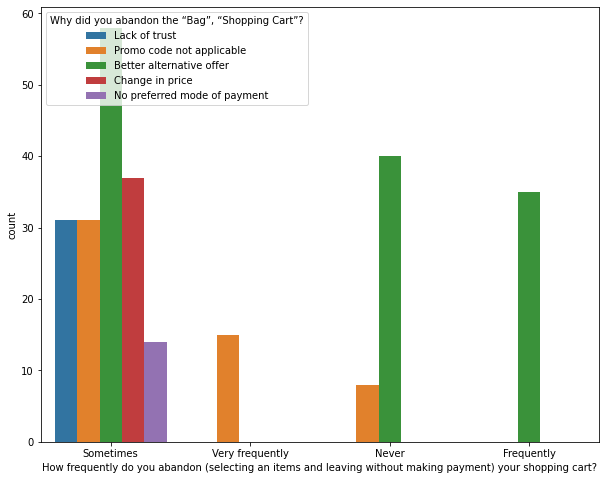

In [26]:
plt.figure(figsize=(10,8))
sns.countplot(df['How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?'],hue=df['Why did you abandon the “Bag”, “Shopping Cart”?'])

#Finding better alternate is the reason which force people to abandon the product to leave the material at the shopping cart

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Amazon.in, Paytm.com'),
  Text(1, 0, 'Amazon.in, Flipkart.com, Myntra.com, Snapdeal.com'),
  Text(2, 0, 'Amazon.in, Paytm.com, Myntra.com'),
  Text(3, 0, 'Amazon.in, Flipkart.com, Paytm.com, Myntra.com, Snapdeal.com'),
  Text(4, 0, 'Amazon.in, Flipkart.com, Paytm.com, Snapdeal.com'),
  Text(5, 0, 'Amazon.in, Flipkart.com'),
  Text(6, 0, 'Amazon.in, Flipkart.com, Snapdeal.com'),
  Text(7, 0, 'Amazon.in'),
  Text(8, 0, 'Amazon.in, Flipkart.com, Paytm.com')])

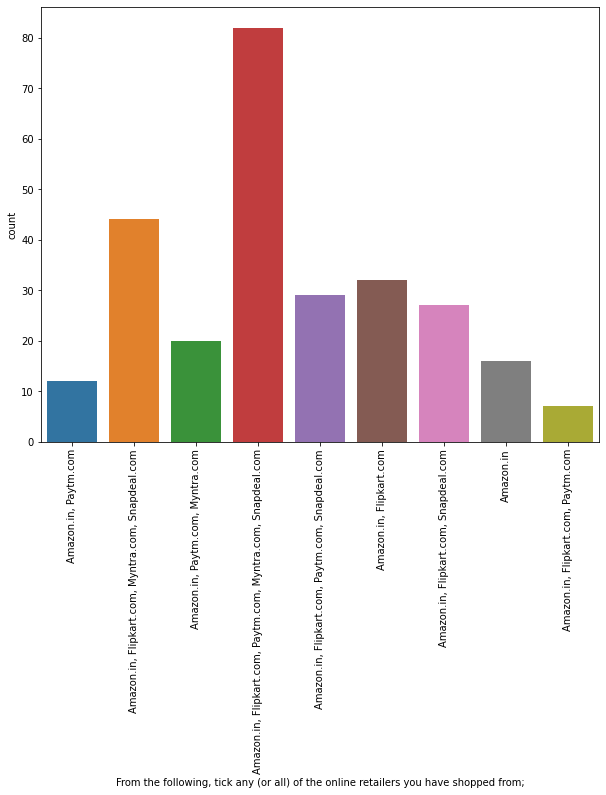

In [27]:
plt.figure(figsize=(10,8))
sns.countplot(x="From the following, tick any (or all) of the online retailers you have shopped from;" ,data=df)
plt.xticks(rotation=90)

Amazon.com and flipkart.com is the most preferred shopping website. 

# LET'S UNDERSTAND THE CUSTOMER OPINION

In [28]:
data1=df.iloc[:,17:47]
data1

,The content on the website must be easy to read and understand,Information on similar product to the one highlighted is important for product comparison,Complete information on listed seller and product being offered is important for purchase decision.,All relevant information on listed products must be stated clearly,Ease of navigation in website,Loading and processing speed,User friendly Interface of the website,Convenient Payment methods,Trust that the online retail store will fulfill its part of the transaction at the stipulated time,Empathy (readiness to assist with queries) towards the customers,Being able to guarantee the privacy of the customer,"Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",Online shopping gives monetary benefit and discounts,Enjoyment is derived from shopping online,Shopping online is convenient and flexible,Return and replacement policy of the e-tailer is important for purchase decision,Gaining access to loyalty programs is a benefit of shopping online,Displaying quality Information on the website improves satisfaction of customers,User derive satisfaction while shopping on a good quality website or application,Net Benefit derived from shopping online can lead to users satisfaction,User satisfaction cannot exist without trust,Offering a wide variety of listed product in several category,Provision of complete and relevant product information,Monetary savings,The Convenience of patronizing the online retailer,Shopping on the website gives you the sense of adventure,Shopping on your preferred e-tailer enhances your social status,You feel gratification shopping on your favorite e-tailer,Shopping on the website helps you fulfill certain roles,Getting value for money spent
0,Agree (4),Indifferent (3),Indifferent (3),Agree (4),Agree (4),Strongly disagree (1),Dis-agree (2),Dis-agree (2),Disagree (2),Strongly agree (5),Agree (4),Agree (4),indifferent (3),Strongly disagree (1),Dis-agree (2),Dis-agree (2),Agree (4),indifferent (3),Strongly agree (5),Agree (4),Strongly agree (5),indifferent (3),indifferent (3),Disagree (2),indifferent (3),Agree (4),Agree (4),Strongly agree (5),Agree (4),Strongly agree (5)
1,Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),indifferent (3),indifferent (3),indifferent (3),Strongly agree (5),Strongly agree (5),Strongly agree (5)
2,Strongly agree (5),Agree (4),Agree (4),Agree (4),Agree (4),Agree (4),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Agree (4),Strongly agree (5),Strongly agree (5),Strongly agree (5),Agree (4),Agree (4),Agree (4),indifferent (3),indifferent (3),Agree (4)
3,Agree (4),Agree (4),Indifferent (3),Agree (4),Strongly agree (5),Agree (4),Strongly agree (5),Strongly agree (5),Agree (4),Strongly agree (5),Strongly agree (5),Agree (4),Agree (4),indifferent (3),indifferent (3),Agree (4),indifferent (3),indifferent (3),Agree (4),indifferent (3),Agree (4),Agree (4),Agree (4),Strongly agree (5),Agree (4),Agree (4),Strongly agree (5),Agree (4),indifferent (3),Agree (4)
4,Strongly agree (5),Indifferent (3),Indifferent (3),Agree (4),Agree (4),Strongly agree (5),Strongly agree (5),Strongly agree (5),Agree (4),Strongly agree (5),Agree (4),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Strongly agree (5),Dis-agree (2),Agree (4),Strongly agree (5),Strongly agree (5),Strongly a

In [29]:
data1=data1.replace({'Agree (4)':'Agree','Strongly agree (5)':'Strongly agree','indifferent (3)':'indifferent','Strongly disagree (1)':"Strongly disagree",'Dis-agree (2)':'Disagree'})

In [30]:
data1=data1.replace({"Indifferent (3)":'indifferent',"Disagree (2)":"Disagree"})
data1=data1.replace({"Indifferent":"Neither agree nor disagree"})
data1=data1.replace({"indifferent":"Neither agree nor disagree"})
data1=data1.replace({"indifferent  (3)":"Neither agree nor disagree"})
data1

,The content on the website must be easy to read and understand,Information on similar product to the one highlighted is important for product comparison,Complete information on listed seller and product being offered is important for purchase decision.,All relevant information on listed products must be stated clearly,Ease of navigation in website,Loading and processing speed,User friendly Interface of the website,Convenient Payment methods,Trust that the online retail store will fulfill its part of the transaction at the stipulated time,Empathy (readiness to assist with queries) towards the customers,Being able to guarantee the privacy of the customer,"Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",Online shopping gives monetary benefit and discounts,Enjoyment is derived from shopping online,Shopping online is convenient and flexible,Return and replacement policy of the e-tailer is important for purchase decision,Gaining access to loyalty programs is a benefit of shopping online,Displaying quality Information on the website improves satisfaction of customers,User derive satisfaction while shopping on a good quality website or application,Net Benefit derived from shopping online can lead to users satisfaction,User satisfaction cannot exist without trust,Offering a wide variety of listed product in several category,Provision of complete and relevant product information,Monetary savings,The Convenience of patronizing the online retailer,Shopping on the website gives you the sense of adventure,Shopping on your preferred e-tailer enhances your social status,You feel gratification shopping on your favorite e-tailer,Shopping on the website helps you fulfill certain roles,Getting value for money spent
0,Agree,Neither agree nor disagree,Neither agree nor disagree,Agree,Agree,Strongly disagree,Disagree,Disagree,Disagree,Strongly agree,Agree,Agree,Neither agree nor disagree,Strongly disagree,Disagree,Disagree,Agree,Neither agree nor disagree,Strongly agree,Agree,Strongly agree,Neither agree nor disagree,Neither agree nor disagree,Disagree,Neither agree nor disagree,Agree,Agree,Strongly agree,Agree,Strongly agree
1,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Strongly agree,Strongly agree,Strongly agree
2,Strongly agree,Agree,Agree,Agree,Agree,Agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Agree,Strongly agree,Strongly agree,Strongly agree,Agree,Agree,Agree,Neither agree nor disagree,Neither agree nor disagree,Agree
3,Agree,Agree,Neither agree nor disagree,Agree,Strongly agree,Agree,Strongly agree,Strongly agree,Agree,Strongly agree,Strongly agree,Agree,Agree,Neither agree nor disagree,Neither agree nor disagree,Agree,Neither agree nor disagree,Neither agree nor disagree,Agree,Neither agree nor disagree,Agree,Agree,Agree,Strongly agree,Agree,Agree,Strongly agree,Agree,Neither agree nor disagree,Agree
4,Strongly agree,Neither agree nor disagree,Neither agree nor disagree,Agree,Agree,Strongly agree,Strongly agree,Strongly agree,Agree,Strongly agree,Agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Disagree,Agree,Strongly agree,Strongly agree,Strongly agree,Agree,Agree,Strongly agree,Agree,Neither agree nor disagree,Strongly disagree,Strongly agree,Strongly disagree,Strongly agree
5,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agr

<Figure size 2160x2160 with 0 Axes>

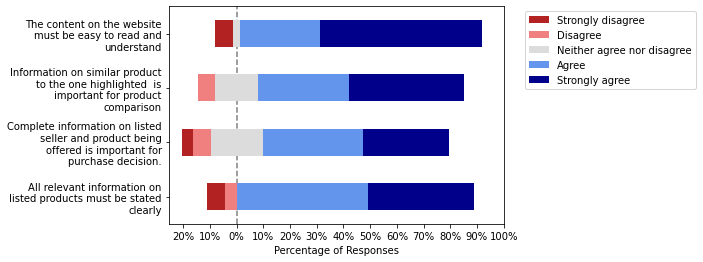

In [31]:
fig = plt.figure(figsize=(30,30))
df1=data1.iloc[:,0:4]
plot_likert.plot_likert(df1,plot_likert.scales.agree, plot_percentage=True,);

<Figure size 2160x2160 with 0 Axes>

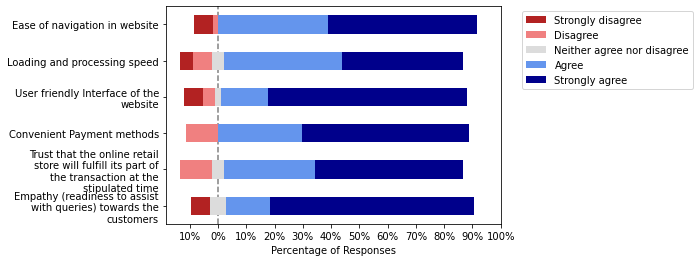

In [32]:
fig = plt.figure(figsize=(30,30))
df1=data1.iloc[:,4:10]
plot_likert.plot_likert(df1,plot_likert.scales.agree, plot_percentage=True,);

<Figure size 2160x2160 with 0 Axes>

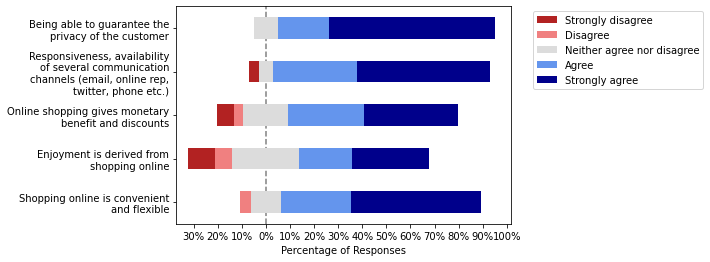

In [33]:
fig = plt.figure(figsize=(30,30))
df1=data1.iloc[:,10:15]
plot_likert.plot_likert(df1,plot_likert.scales.agree, plot_percentage=True,);

<AxesSubplot:xlabel='Percentage of Responses'>

<Figure size 2160x2160 with 0 Axes>

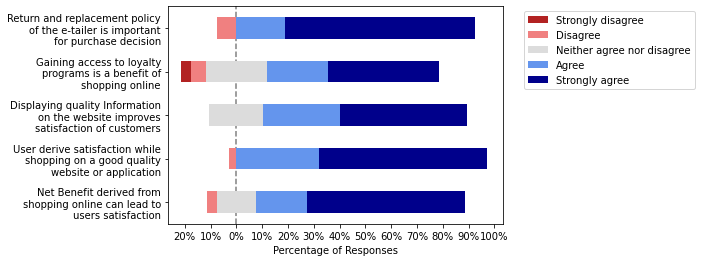

In [34]:
fig = plt.figure(figsize=(30,30))
df1=data1.iloc[:,15:20]
plot_likert.plot_likert(df1,plot_likert.scales.agree, plot_percentage=True)

<AxesSubplot:xlabel='Percentage of Responses'>

<Figure size 2160x2160 with 0 Axes>

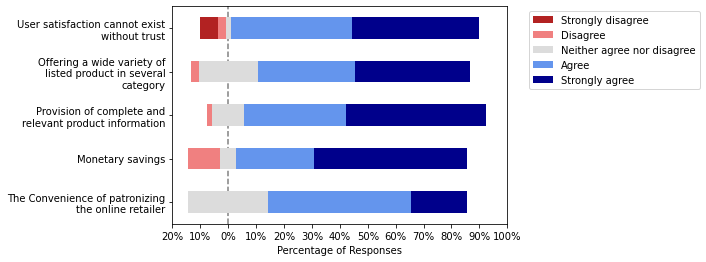

In [35]:
fig = plt.figure(figsize=(30,30))
df1=data1.iloc[:,20:25]
plot_likert.plot_likert(df1,plot_likert.scales.agree, plot_percentage=True)

<AxesSubplot:xlabel='Percentage of Responses'>

<Figure size 2160x2160 with 0 Axes>

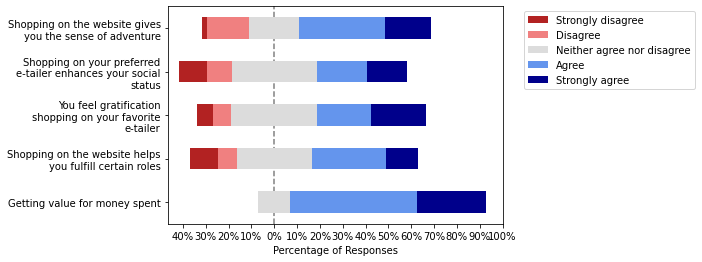

In [36]:
fig = plt.figure(figsize=(30,30))
df1=data1.iloc[:,25:30]
plot_likert.plot_likert(df1,plot_likert.scales.agree, plot_percentage=True)

# Let's check the prefermance of the shopping website

In [37]:
performance=['Easy to use website or application',
       'Visual appealing web-page layout', 'Wild variety of product on offer',
       'Complete, relevant description information of products',
       'Fast loading website speed of website and application',
       'Reliability of the website or application',
       'Quickness to complete purchase',
       'Availability of several payment options', 'Speedy order delivery',
       'Privacy of customers’ information',
       'Security of customer financial information',
       'Perceived Trustworthiness',
       'Presence of online assistance through multi-channel']

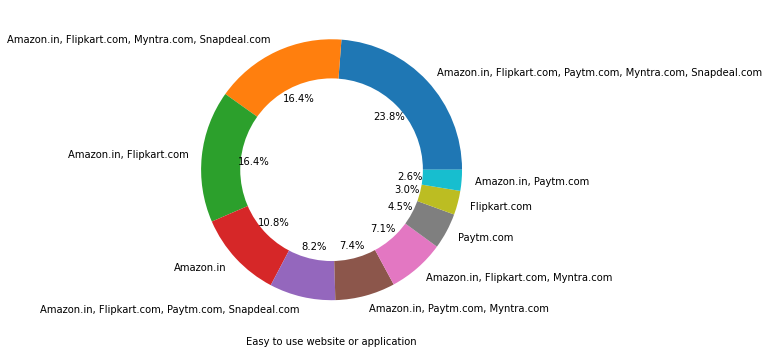

<Figure size 432x288 with 0 Axes>

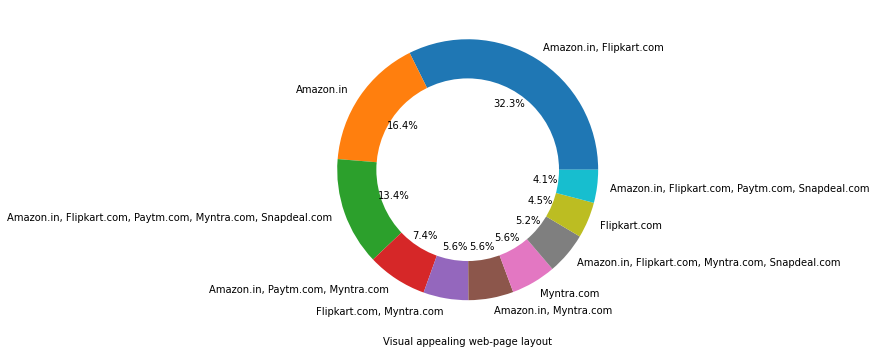

<Figure size 432x288 with 0 Axes>

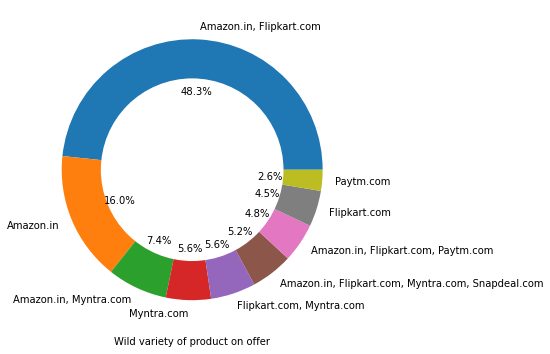

<Figure size 432x288 with 0 Axes>

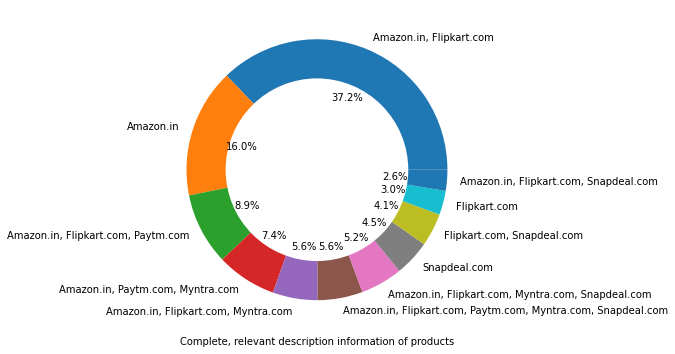

<Figure size 432x288 with 0 Axes>

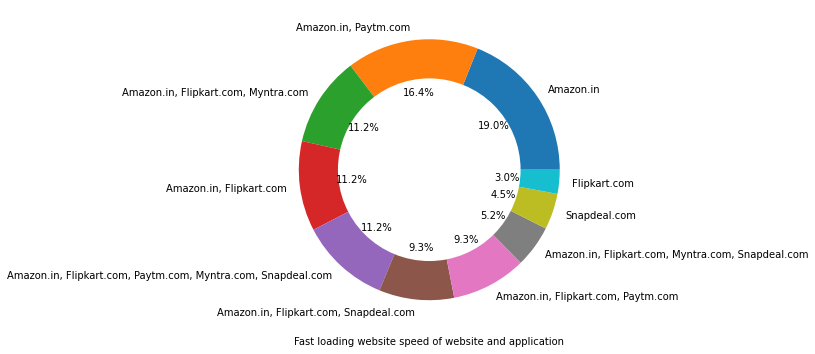

<Figure size 432x288 with 0 Axes>

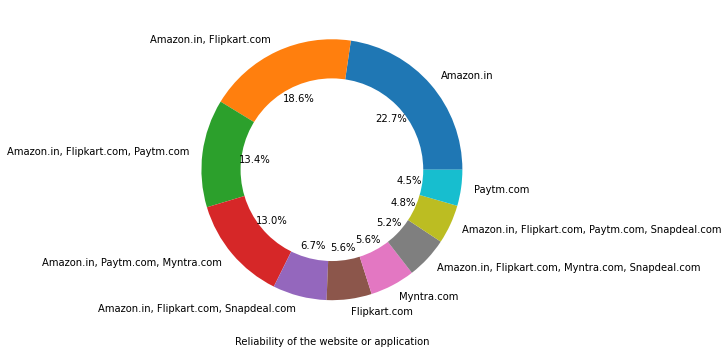

<Figure size 432x288 with 0 Axes>

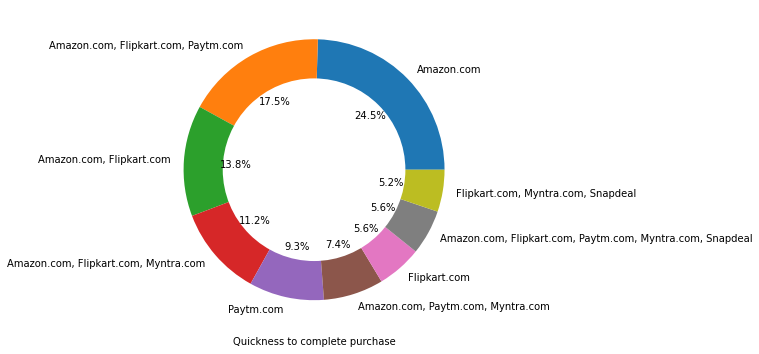

<Figure size 432x288 with 0 Axes>

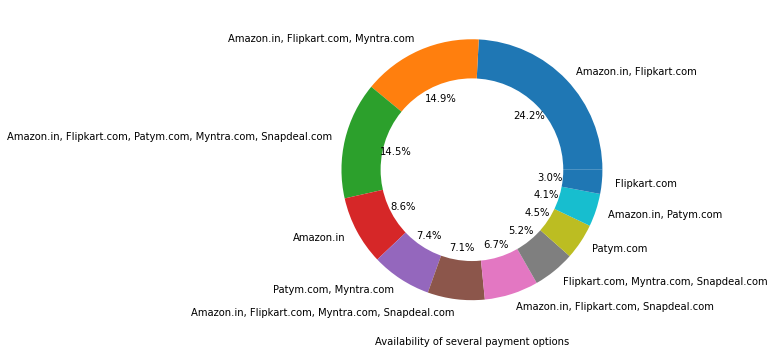

<Figure size 432x288 with 0 Axes>

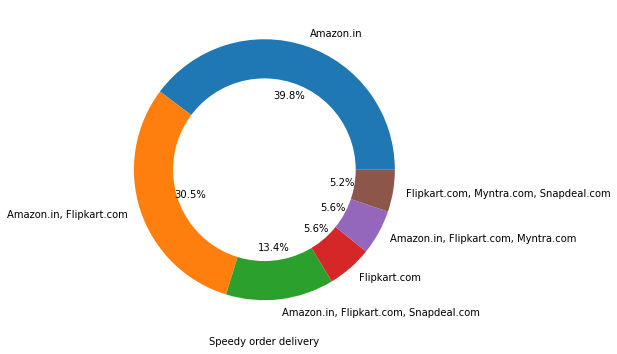

<Figure size 432x288 with 0 Axes>

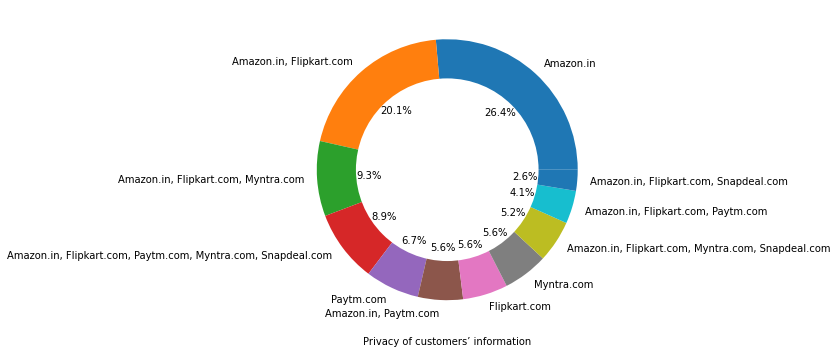

<Figure size 432x288 with 0 Axes>

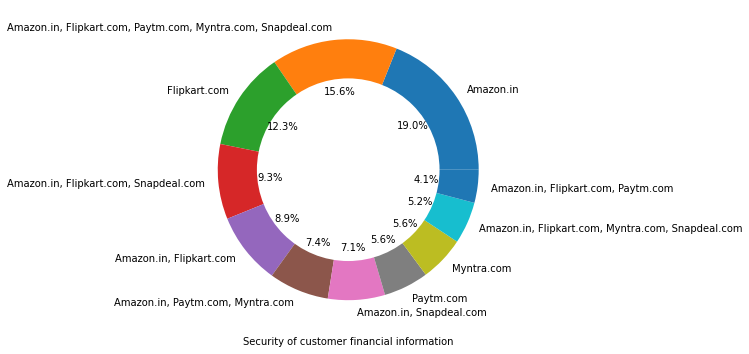

<Figure size 432x288 with 0 Axes>

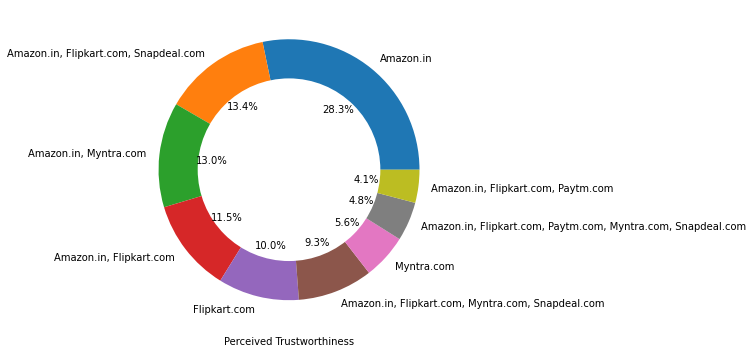

<Figure size 432x288 with 0 Axes>

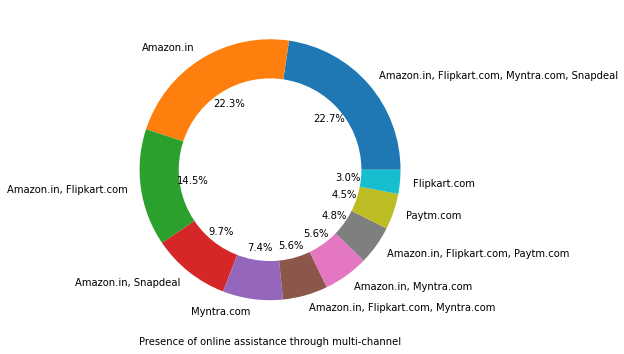

<Figure size 432x288 with 0 Axes>

In [38]:
for m in performance:
        plt.figure(figsize=(8,6))
        df[m].value_counts().plot.pie(autopct='%1.1f%%')
        centre=plt.Circle((0,0),0.7,fc='white')
        fig=plt.gcf()
        fig.gca().add_artist(centre)
        plt.xlabel(m)
        plt.ylabel('')
        plt.figure()

Amazon.in is most convenient to use for shopping followed by flipkart.com
Amazon.in is the best visual appealing website for shopping followed by flipkart.com.
Amazon.in has a wise variety of offers than any other website for shopping followed by flipkart.com.
Amazon.in provides complete informationand relevnat description than any other website for shopping followed by flipkart.com.
Amazon.in is the fast loading website  
Amazon.in grabs more votes in reliability section. 
Amazon.in is very quick in terms of purchase completing conveniance.
Amazon.in has vide variety of payment option.
Amazon.in is fast in delievring the customer orders,best in keeping secure the personal and fincancial information of customers. 
Seems like amazon is beating all other shopping website in the market in terms of providing the best customer experince. 

In [39]:
#Collecting all the negative remarks about a brand
bad=['Longer time to get logged in (promotion, sales period)',
       'Longer time in displaying graphics and photos (promotion, sales period)',
       'Late declaration of price (promotion, sales period)',
       'Longer page loading time (promotion, sales period)',
       'Limited mode of payment on most products (promotion, sales period)',
       'Longer delivery period', 'Change in website/Application design',
       'Frequent disruption when moving from one page to another']

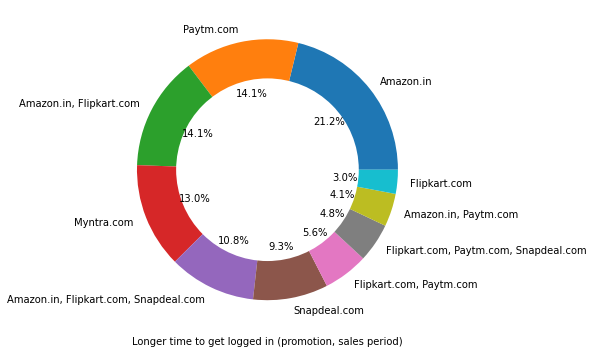

<Figure size 432x288 with 0 Axes>

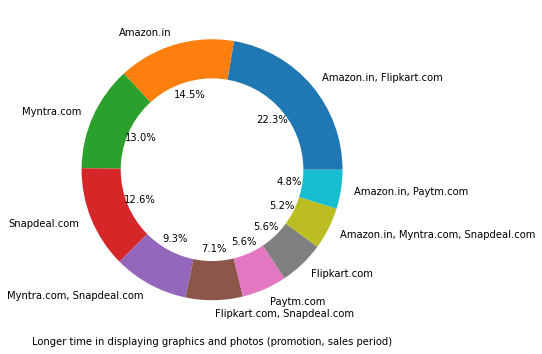

<Figure size 432x288 with 0 Axes>

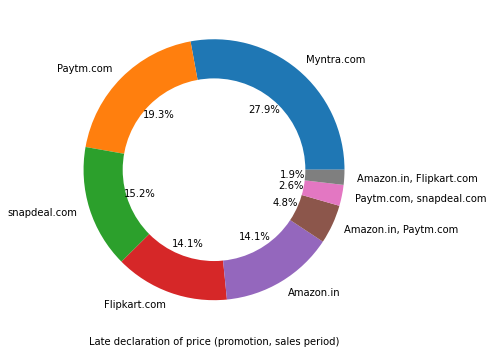

<Figure size 432x288 with 0 Axes>

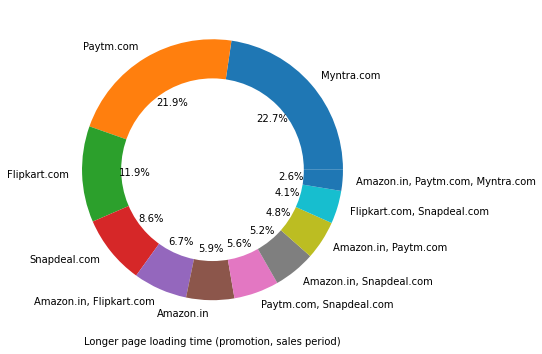

<Figure size 432x288 with 0 Axes>

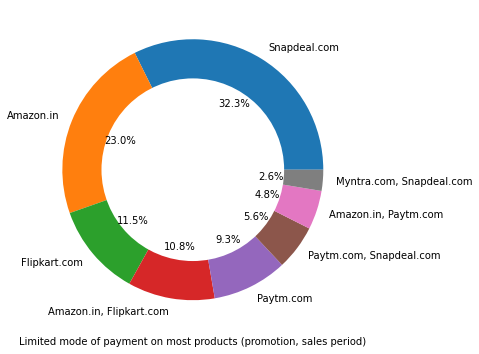

<Figure size 432x288 with 0 Axes>

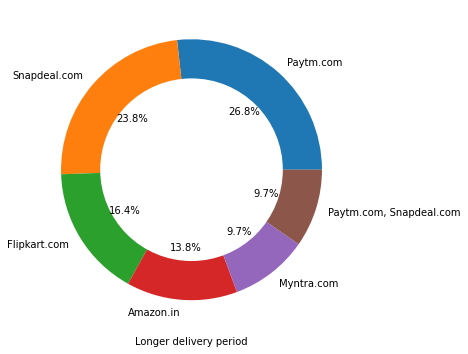

<Figure size 432x288 with 0 Axes>

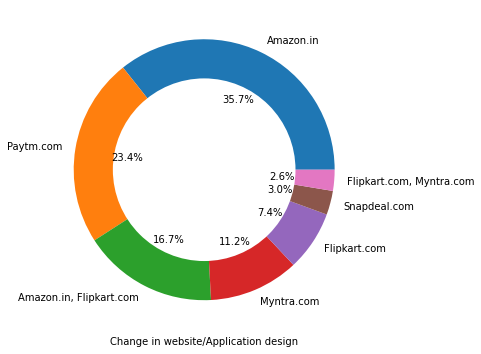

<Figure size 432x288 with 0 Axes>

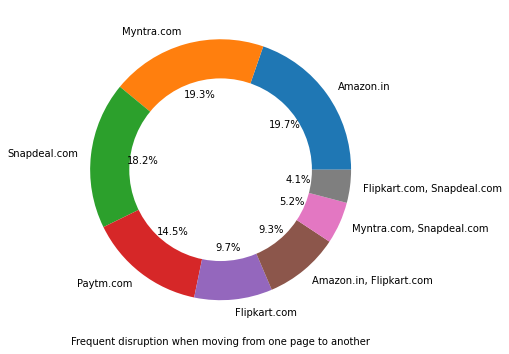

<Figure size 432x288 with 0 Axes>

In [40]:
for t in bad:
        plt.figure(figsize=(8,6))
        df[t].value_counts().plot.pie(autopct='%1.1f%%')
        centre=plt.Circle((0,0),0.7,fc='white')
        fig=plt.gcf()
        fig.gca().add_artist(centre)
        plt.xlabel(t)
        plt.ylabel('')
        plt.figure()

The customer has to wait for a longer time to get logged at times promotion, sales period in Amazon.in(21.2%) followed by Paytm.com and Myntra.com.
Amazon.in, Myntra.com, snapdel.com has to seriouly work to increase the speed of their website at the time of (promotion,sales period) to reduce the time in reflecting graaphics and photos
Myntra.com delcares their price very late during sales period/promotion. also their page take longer time to load during sales period/promotion. 
Snapdeal has limited number of payment modes. 
snapdeal and paytm take long time for deliveries. 
Customer faces issues and disruption while moving from one page to another in Amazon.in, Snapdeal.com and Myntra.com. 

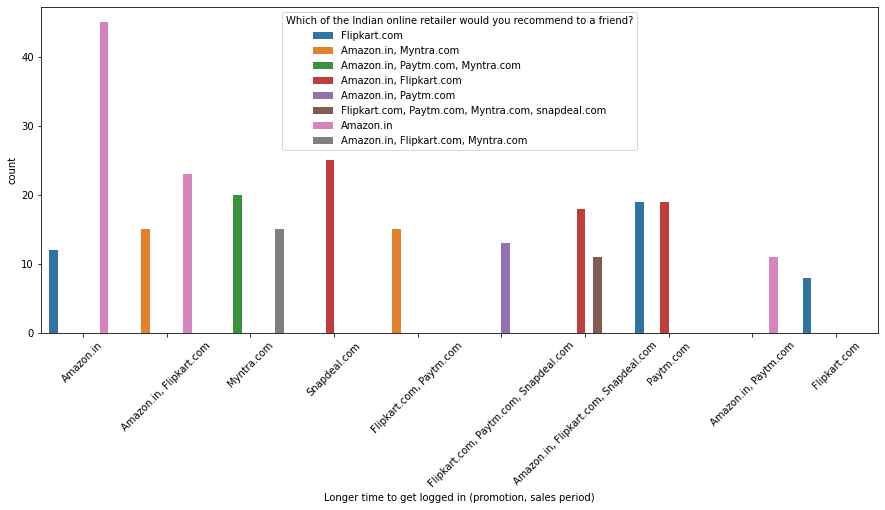

<Figure size 432x288 with 0 Axes>

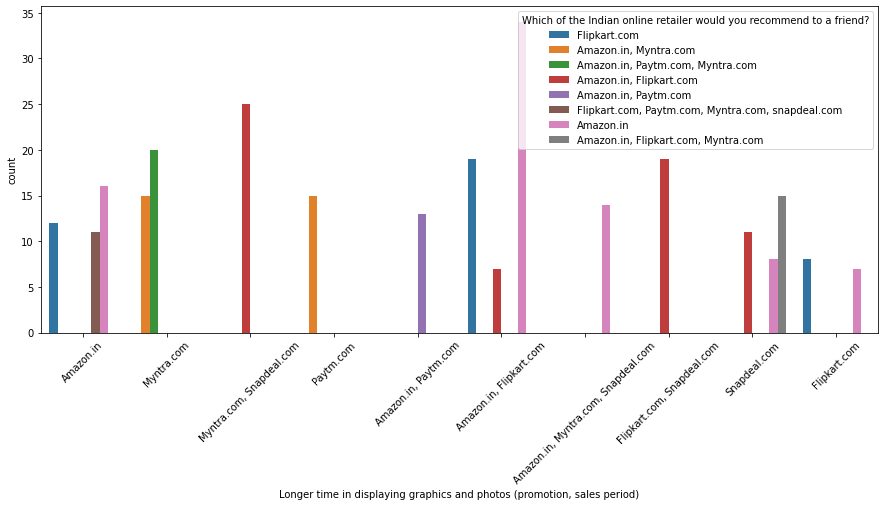

<Figure size 432x288 with 0 Axes>

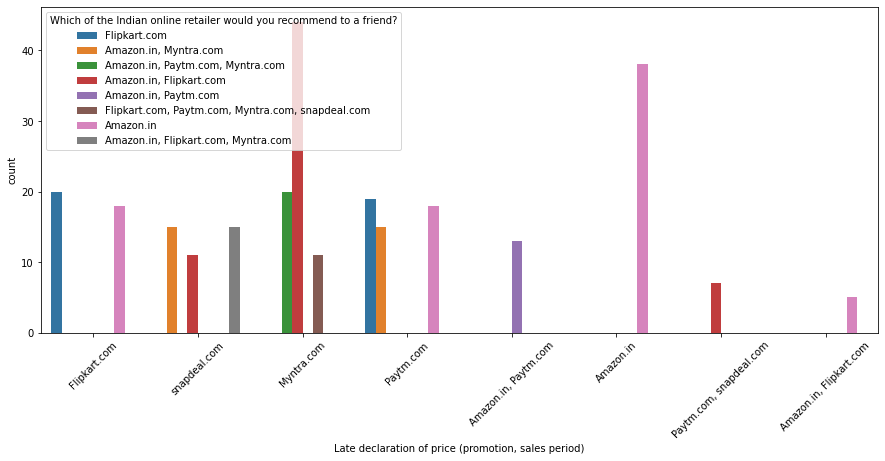

<Figure size 432x288 with 0 Axes>

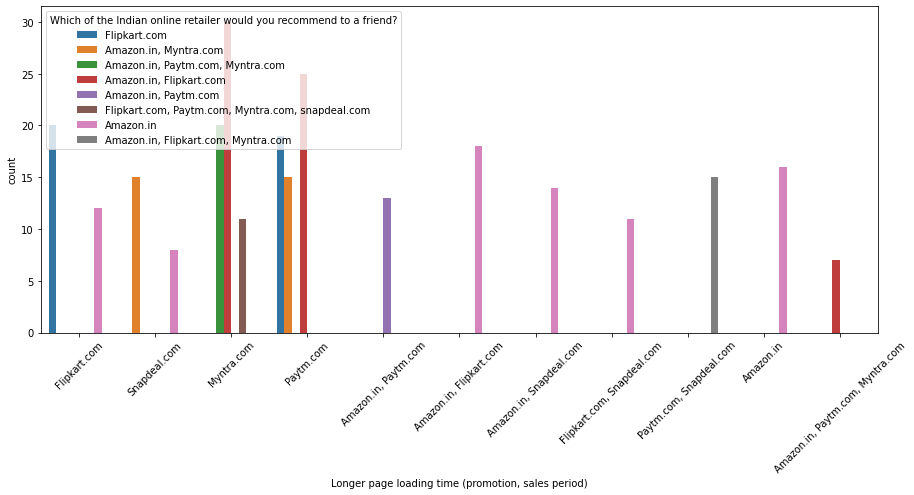

<Figure size 432x288 with 0 Axes>

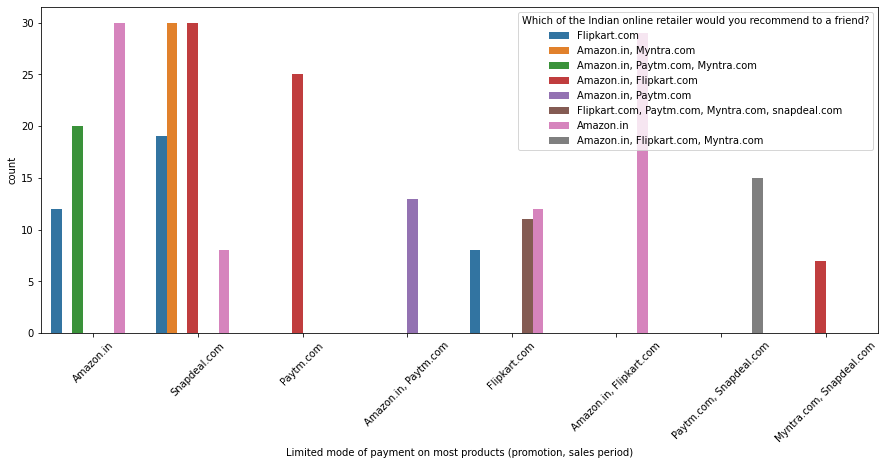

<Figure size 432x288 with 0 Axes>

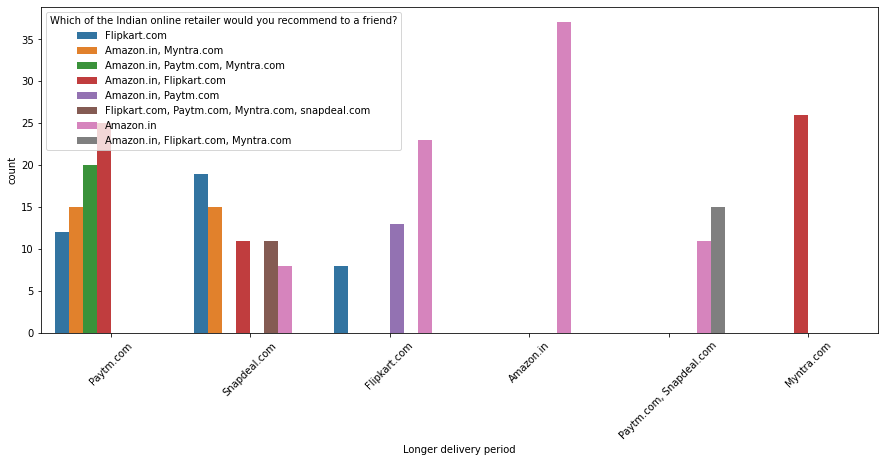

<Figure size 432x288 with 0 Axes>

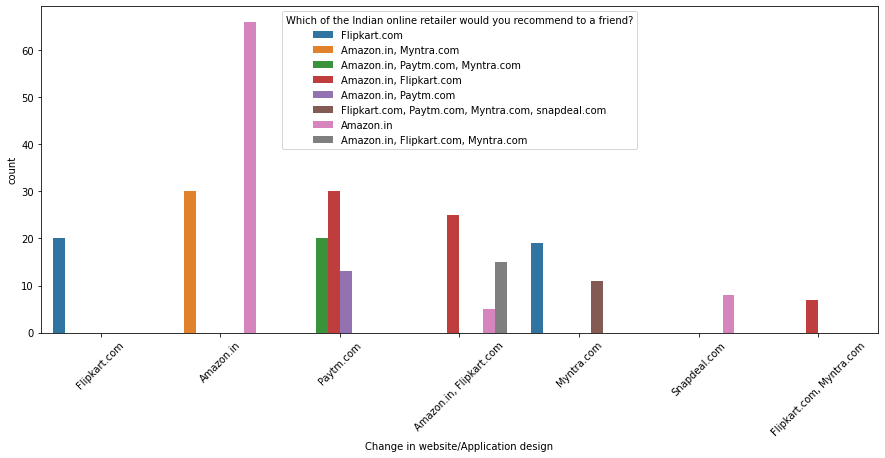

<Figure size 432x288 with 0 Axes>

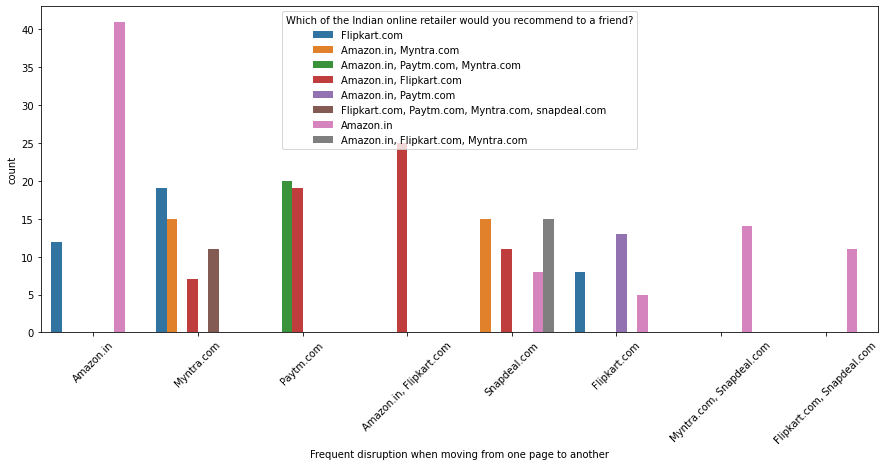

<Figure size 432x288 with 0 Axes>

In [41]:
for i in bad:
        plt.figure(figsize=(15,6))
        sns.countplot(df[i],hue=df['Which of the Indian online retailer would you recommend to a friend?'])
        plt.xticks(rotation=45)
        plt.figure()

Customers seem to be more loyal to amazon, flipkart and paytm as even though many of them have given negative remarks about them still they would recommend these platforms to their friend

In [42]:
data1.shape

(269, 30)

# MODELLING THE DATA

In [43]:
#Converting the Data from object to float. 
le=LabelEncoder()
df["Gender of respondent"]=le.fit_transform(df["Gender of respondent"].astype(str))
df["How old are you?"]=le.fit_transform(df["How old are you?"].astype(str))
df["Which city do you shop online from?"]=le.fit_transform(df["Which city do you shop online from?"].astype(str))
df["What is the Pin Code of where you shop online from?"]=le.fit_transform(df["What is the Pin Code of where you shop online from?"].astype(str))
df["Since How Long You are Shopping Online ?"]=le.fit_transform(df["Since How Long You are Shopping Online ?"].astype(str))
df["How many times you have made an online purchase in the past  year?"]=le.fit_transform(df["How many times you have made an online purchase in the past  year?"].astype(str))
df["How do you access the internet while shopping on-line?"]=le.fit_transform(df["How do you access the internet while shopping on-line?"].astype(str))
df["Which device do you use to access the online shopping?"]=le.fit_transform(df["Which device do you use to access the online shopping?"].astype(str))
df["What is the screen size of your mobile device?"]=le.fit_transform(df["What is the screen size of your mobile device?"].astype(str))
df["What is the operating system (OS) of your device?"]=le.fit_transform(df["What is the operating system (OS) of your device?"].astype(str))
df["What browser do you run on your device to access the website?"]=le.fit_transform(df["What browser do you run on your device to access the website?"].astype(str))
df["Which channel did you follow to arrive at your favorite online store for the first time?"]=le.fit_transform(df["Which channel did you follow to arrive at your favorite online store for the first time?"].astype(str))
df["After first visit, how do you reach the online retail store?"]=le.fit_transform(df["After first visit, how do you reach the online retail store?"].astype(str))
df["How much time do you explore the e- retail store before making a purchase decision?"]=le.fit_transform(df["How much time do you explore the e- retail store before making a purchase decision?"].astype(str))
df["What is your preferred payment Option?"]=le.fit_transform(df["What is your preferred payment Option?"].astype(str))
df["Why did you abandon the “Bag”, “Shopping Cart”?"]=le.fit_transform(df["Why did you abandon the “Bag”, “Shopping Cart”?"].astype(str))
df["The content on the website must be easy to read and understand"]=le.fit_transform(df["The content on the website must be easy to read and understand"].astype(str))
df["Information on similar product to the one highlighted  is important for product comparison"]=le.fit_transform(df["Information on similar product to the one highlighted  is important for product comparison"].astype(str))
df["Complete information on listed seller and product being offered is important for purchase decision."]=le.fit_transform(df["Complete information on listed seller and product being offered is important for purchase decision."].astype(str))
df["All relevant information on listed products must be stated clearly"]=le.fit_transform(df["All relevant information on listed products must be stated clearly"].astype(str))
df["Ease of navigation in website"]=le.fit_transform(df["Ease of navigation in website"].astype(str))
df["Loading and processing speed"]=le.fit_transform(df["Loading and processing speed"].astype(str))
df["User friendly Interface of the website"]=le.fit_transform(df["User friendly Interface of the website"].astype(str))
df["Convenient Payment methods"]=le.fit_transform(df["Convenient Payment methods"].astype(str))
df["Trust that the online retail store will fulfill its part of the transaction at the stipulated time"]=le.fit_transform(df["Trust that the online retail store will fulfill its part of the transaction at the stipulated time"].astype(str))
df["Empathy (readiness to assist with queries) towards the customers"]=le.fit_transform(df["Empathy (readiness to assist with queries) towards the customers"].astype(str))
df["Being able to guarantee the privacy of the customer"]=le.fit_transform(df["Being able to guarantee the privacy of the customer"].astype(str))
df["Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)"]=le.fit_transform(df["Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)"].astype(str))
df["Online shopping gives monetary benefit and discounts"]=le.fit_transform(df["Online shopping gives monetary benefit and discounts"].astype(str))
df["Enjoyment is derived from shopping online"]=le.fit_transform(df["Enjoyment is derived from shopping online"].astype(str))
df["Shopping online is convenient and flexible"]=le.fit_transform(df["Shopping online is convenient and flexible"].astype(str))
df["Return and replacement policy of the e-tailer is important for purchase decision"]=le.fit_transform(df["Return and replacement policy of the e-tailer is important for purchase decision"].astype(str))
df["Gaining access to loyalty programs is a benefit of shopping online"]=le.fit_transform(df["Gaining access to loyalty programs is a benefit of shopping online"].astype(str))
df["Displaying quality Information on the website improves satisfaction of customers"]=le.fit_transform(df["Displaying quality Information on the website improves satisfaction of customers"].astype(str))
df["User derive satisfaction while shopping on a good quality website or application"]=le.fit_transform(df["User derive satisfaction while shopping on a good quality website or application"].astype(str))
df["Net Benefit derived from shopping online can lead to users satisfaction"]=le.fit_transform(df["Net Benefit derived from shopping online can lead to users satisfaction"].astype(str))
df["User satisfaction cannot exist without trust"]=le.fit_transform(df["User satisfaction cannot exist without trust"].astype(str))
df["Offering a wide variety of listed product in several category"]=le.fit_transform(df["Offering a wide variety of listed product in several category"].astype(str))
df["Provision of complete and relevant product information"]=le.fit_transform(df["Provision of complete and relevant product information"].astype(str))
df["Monetary savings"]=le.fit_transform(df["Monetary savings"].astype(str))
df["The Convenience of patronizing the online retailer"]=le.fit_transform(df["The Convenience of patronizing the online retailer"].astype(str))
df["Shopping on the website gives you the sense of adventure"]=le.fit_transform(df["Shopping on the website gives you the sense of adventure"].astype(str))
df["Shopping on your preferred e-tailer enhances your social status"]=le.fit_transform(df["Shopping on your preferred e-tailer enhances your social status"].astype(str))
df["You feel gratification shopping on your favorite e-tailer"]=le.fit_transform(df["You feel gratification shopping on your favorite e-tailer"].astype(str))
df["Shopping on the website helps you fulfill certain roles"]=le.fit_transform(df["Shopping on the website helps you fulfill certain roles"].astype(str))
df["Getting value for money spent"]=le.fit_transform(df["Getting value for money spent"].astype(str))
df["From the following, tick any (or all) of the online retailers you have shopped from;"]=le.fit_transform(df["From the following, tick any (or all) of the online retailers you have shopped from;"].astype(str))
df["Easy to use website or application"]=le.fit_transform(df["Easy to use website or application"].astype(str))
df["Visual appealing web-page layout"]=le.fit_transform(df["Visual appealing web-page layout"].astype(str))
df["Wild variety of product on offer"]=le.fit_transform(df["Wild variety of product on offer"].astype(str))
df["Complete, relevant description information of products"]=le.fit_transform(df["Complete, relevant description information of products"].astype(str))
df["Fast loading website speed of website and application"]=le.fit_transform(df["Fast loading website speed of website and application"].astype(str))
df["Reliability of the website or application"]=le.fit_transform(df["Reliability of the website or application"].astype(str))
df["Quickness to complete purchase"]=le.fit_transform(df["Quickness to complete purchase"].astype(str))
df["Availability of several payment options"]=le.fit_transform(df["Availability of several payment options"].astype(str))
df["Speedy order delivery"]=le.fit_transform(df["Speedy order delivery"].astype(str))
df["Privacy of customers’ information"]=le.fit_transform(df["Privacy of customers’ information"].astype(str))
df["Security of customer financial information"]=le.fit_transform(df["Security of customer financial information"].astype(str))
df["Perceived Trustworthiness"]=le.fit_transform(df["Perceived Trustworthiness"].astype(str))
df["Presence of online assistance through multi-channel"]=le.fit_transform(df["Presence of online assistance through multi-channel"].astype(str))
df["Longer time to get logged in (promotion, sales period)"]=le.fit_transform(df["Longer time to get logged in (promotion, sales period)"].astype(str))
df["Longer time in displaying graphics and photos (promotion, sales period)"]=le.fit_transform(df["Longer time in displaying graphics and photos (promotion, sales period)"].astype(str))
df["Late declaration of price (promotion, sales period)"]=le.fit_transform(df["Late declaration of price (promotion, sales period)"].astype(str))
df["Longer page loading time (promotion, sales period)"]=le.fit_transform(df["Longer page loading time (promotion, sales period)"].astype(str))
df["Limited mode of payment on most products (promotion, sales period)"]=le.fit_transform(df["Limited mode of payment on most products (promotion, sales period)"].astype(str))
df["Longer delivery period"]=le.fit_transform(df["Longer delivery period"].astype(str))
df["Change in website/Application design"]=le.fit_transform(df["Change in website/Application design"].astype(str))
df["Frequent disruption when moving from one page to another"]=le.fit_transform(df["Frequent disruption when moving from one page to another"].astype(str))
df["Website is as efficient as before"]=le.fit_transform(df["Website is as efficient as before"].astype(str))
df["Which of the Indian online retailer would you recommend to a friend?"]=le.fit_transform(df["Which of the Indian online retailer would you recommend to a friend?"].astype(str))

In [44]:
df["How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?"]=le.fit_transform(df["How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?"].astype(str))

In [45]:
df

,Gender of respondent,How old are you?,Which city do you shop online from?,What is the Pin Code of where you shop online from?,Since How Long You are Shopping Online ?,How many times you have made an online purchase in the past year?,How do you access the internet while shopping on-line?,Which device do you use to access the online shopping?,What is the screen size of your mobile device?,What is the operating system (OS) of your device?,What browser do you run on your device to access the website?,Which channel did you follow to arrive at your favorite online store for the first time?,"After first visit, how do you reach the online retail store?",How much time do you explore the e- retail store before making a purchase decision?,What is your preferred payment Option?,How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?,"Why did you abandon the “Bag”, “Shopping Cart”?",The content on the website must be easy to read and understand,Information on similar product to the one highlighted is important for product comparison,Complete information on listed seller and product being offered is important for purchase decision.,All relevant information on listed products must be stated clearly,Ease of navigation in website,Loading and processing speed,User friendly Interface of the website,Convenient Payment methods,Trust that the online retail store will fulfill its part of the transaction at the stipulated time,Empathy (readiness to assist with queries) towards the customers,Being able to guarantee the privacy of the customer,"Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",Online shopping gives monetary benefit and discounts,Enjoyment is derived from shopping online,Shopping online is convenient and flexible,Return and replacement policy of the e-tailer is important for purchase decision,Gaining access to loyalty programs is a benefit of shopping online,Displaying quality Information on the website improves satisfaction of customers,User derive satisfaction while shopping on a good quality website or application,Net Benefit derived from shopping online can lead to users satisfaction,User satisfaction cannot exist without trust,Offering a wide variety of listed product in several category,Provision of complete and relevant product information,Monetary savings,The Convenience of patronizing the online retailer,Shopping on the website gives you the sense of adventure,Shopping on your preferred e-tailer enhances your social status,You feel gratification shopping on your favorite e-tailer,Shopping on the website helps you fulfill certain roles,Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer would you recommend to a friend?
0,1,1,2,1,3,2,0,0,3,2,0,2,2,2,2,2,2,0,2,2,0,0,4,1,1,1,1,0,0,4,3,1,1,0,2,2,0,2,3,3,1,2,0,0,2,0,1,7,9,7,5,10,9,9,8,9,0,0,0,7,9,0,0,3,5,0,3,2,0,0,6
1,0,0,2,5,3,3,3,2,0,1,0

In [46]:
x=df.iloc[:,0:-1]
y=df.iloc[:,-1]

In [47]:
x.shape

(269, 70)

In [48]:
y.shape

(269,)

In [49]:
y.value_counts()

0    79
1    62
6    39
3    30
5    20
2    15
4    13
7    11
Name: Which of the Indian online retailer would you recommend to a friend?, dtype: int64

In [50]:
#Using Mixmax Scaler for bringing the data closer to mean and reducing the standard deviation. 
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
xd=scaler.fit_transform(x)
x=pd.DataFrame(xd)
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69
0,1.0,0.25,0.2,0.026316,0.75,0.50,0.000000,0.000000,1.000000,1.0,0.000000,1.0,0.50,0.50,1.0,0.666667,0.50,0.000000,0.666667,0.50,0.000000,0.000000,1.00,0.25,0.5,0.333333,0.333333,0.0,0.000000,1.00,0.75,0.333333,0.5,0.00,1.0,1.0,0.000000,0.50,1.000000,1.000000,0.333333,1.0,0.00,0.00,0.50,0.00,0.5,0.875,1.000000,0.777778,0.625,1.0,1.000000,1.000000,1.000,0.9,0.0,0.0,0.0,0.875,1.000000,0.000000,0.000000,0.428571,0.5,0.000000,0.6,0.333333,0.000000,0.000000
1,0.0,0.00,0.2,0.131579,0.75,0.75,1.000000,0.666667,0.000000,0.5,0.000000,1.0,1.00,1.00,0.5,1.000000,1.00,0.666667,1.000000,0.75,0.666667,0.666667,0.75,0.75,1.0,0.666667,0.333333,0.5,0.333333,0.50,0.50,0.666667,1.0,0.50,0.5,1.0,0.666667,0.50,0.666667,0.666667,0.666667,1.0,1.00,1.00,0.50,0.50,0.5,0.250,0.333333,0.555556,0.750,0.2,0.222222,0.888889,0.250,0.2,0.2,0.9,0.9,1.000,0.222222,0.111111,0.666667,1.000000,1.0,1.000000,1.0,0.000000,0.571429,0.142857
2,0.0,0.00,0.4,0.605263,0.50,0.75,0.333333,0.666667,0.666667,0.0,0.000000,1.0,1.00,0.25,1.0,0.666667,1.00,0.666667,0.000000,0.00,0.000000,0.000000,0.00,0.75,1.0,0.666667,0.333333,0.5,0.333333,0.50,0.50,0.666667,1.0,0.50,0.5,1.0,0.666667,0.00,0.666667,0.666667,0.666667,0.0,0.00,0.00,1.00,1.00,0.0,1.000,0.777778,0.666667,0.500,0.7,0.777778,0.666667,0.625,1.0,0.0,0.0,0.6,0.750,0.888889,0.777778,0.666667,0.571429,0.7,0.000000,0.6,0.833333,0.857143,0.000000
3,1.0,0.00,0.6,0.289474,0.50,1.00,0.333333,0.666667,0.666667,0.5,1.000000,1.0,0.50,0.50,0.5,0.333333,0.00,0.000000,0.000000,0.50,0.000000,0.666667,0.00,0.75,1.0,0.000000,0.333333,0.5,0.000000,0.00,1.00,1.000000,0.0,1.00,1.0,0.0,1.000000,0.00,0.000000,0.000000,0.666667,0.0,0.00,0.50,0.00,1.00,0.0,0.500,0.444444,0.333333,0.125,0.1,0.666667,0.333333,0.375,0.2,0.6,0.2,0.5,0.625,0.333333,1.000000,0.777778,0.571429,0.8,0.714286,0.6,0.166667,0.142857,0.285714
4,0.0,0.00,0.0,0.815789,0.25,0.00,1.000000,0.666667,0.000000,0.5,1.000000,0.0,1.00,1.00,0.5,0.000000,0.00,0.666667,0.666667,0.50,0.000000,0.000000,0.75,0.75,1.0,0.000000,0.333333,0.0,0.333333,0.50,0.50,0.666667,1.0,0.25,0.0,1.0,0.666667,0.50,0.000000,0.000000,0.666667,0.0,1.00,0.75,0.50,0.75,0.5,0.500,0.444444,1.000000,0.875,0.5,0.000000,0.666667,0.500,0.4,0.0,0.7,1.0,0.750,0.555556,0.555556,0.888889,0.714286,0.8,1.000000,0.6,0.000000,1.000000,0.857143
5,0.0,0.25,0.9,0.605263,0.75,0.75,1.000000,0.666667,0.666667,0.0,0.000000,1.0,1.00,1.00,1.0,0.000000,0.00,0.666667,1.000000,0.75,0.666667,0.666667,0.75,0.75,1.0,0.666667,0.333333,0.5,0.333333,0.50,0.50,0.666667,1.0,0.50,0.5,1.0,0.666667,0.50,0.666667,0.666667,0.666667,0.5,0.50,1.00,1.00,0.00,0.5,0.500,0.444444,0.111111,0.375,0.4,0.777778,0.444444,1.000,0.4,0.0,0.5,0.4,0.500,0.444444,0.666667,0.333333,0.285714,0.2,0.285714,0.2,0.833333,0.285714,0.000000
6,1.0,0.50,0.2,0.052632,0.75,0.50,1.000000,1.000000,1.000000,0.0,0.000000,0.5,0.00,1.00,0.5,0.666667,1.00,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.0,0.000000,0.000000,0.0,0.000000,0.00,0.00,0.000000,1.0,0.50,0.0,0.0,0.000000,0.00,0.000000,1.000000,0.000000,0.0,1.00,1.00,0.00,0.00,0.0,0.625,0.555556,0.333333,0.000,0.9,0.555556,0.555556,0.375,0.5,0.6,0.5,0.4,0.625,0.333333,0.222222,0.000000,0.571429,0.7,0.428571,1.0,0.666667,0.571429,1.000000
7,1.0,0.50,0.2,0.105263,0.50,1.00,0.333333,0.000000,1.000000,1.0,0.000000,1.0,0.25,0.50,0.5,0.666667,0.25,1.000000,0.333333,0.25,1.000000,1.000000,0.25,1.00,0.5,0.333333,0.666667,1.0,0.333333,0.75,0.75,0.666667,1.0,0.50,0.5,1.0,0.000000,0.75,0.666667,0.666667,0.666667,0.5,0.50,0.75,0.75,0.75,0.0,0.500,0.111111,0.111111,0.125,0.1,0.444444,0.000000,0.000,0.1,0.0,1.0,0.8,0.000,0.000000,0.111111,0.111111,0.714286,0.1,0.142857,0.2,0.000000,0.000000,0.000000
8,0.0,1.00,1.0,0.368421,0.25,1.00,1.000000,0.666667,0.666667,0.0,0.000000,1.0,0.00,0.00,0.0,0.666667,0.75,0.666667,0.000000,0.75,0.000000,0.000

In [51]:
#Using PCA for clubing multicolinearity columns for further analysis. 
pca=PCA(n_components=30)
xpca=pca.fit_transform(x)
x=xpca
pd.DataFrame(data=x)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,1.933987,-0.747090,-0.946751,-1.283869,0.640675,-1.085312,0.722577,-0.022473,-0.885023,-0.392224,-0.433606,0.419685,0.163201,-0.218451,0.366080,0.325601,0.079779,-0.725801,0.466491,0.232142,-0.201533,0.028347,0.088782,-0.309450,0.082450,0.184520,-0.212454,0.080011,-0.006818,0.005988
1,-0.211823,-1.381119,1.054322,0.695559,0.118392,-0.833971,0.033584,-0.641159,0.077034,-0.336830,-0.053385,-0.764275,0.780992,0.349101,-0.107755,0.015563,-0.599489,-0.130591,-0.453515,-0.031240,-0.286601,0.023839,-0.343465,-0.290114,-0.263725,0.035307,0.115869,-0.081531,0.046061,-0.000348
2,1.497253,-0.255406,0.871583,-1.447625,0.070699,0.859436,-0.760161,0.097238,0.498206,-0.479970,-0.043037,0.228695,-0.033652,0.594852,0.019861,-0.093808,-0.142686,0.222275,0.076812,0.177866,0.056169,-0.030796,-0.217405,-0.151138,-0.119325,-0.047121,-0.193459,0.039327,0.027519,-0.000370
3,0.296746,2.135765,0.788867,-0.208143,-1.318812,-0.127658,0.557648,-0.509837,-0.170059,-0.121575,-0.388548,-0.127768,0.068093,-0.082070,0.004521,-0.013221,0.224273,0.038112,0.187090,-0.094746,-0.089915,0.098553,-0.213227,-0.053768,-0.022098,-0.090327,-0.111775,0.021621,-0.023850,0.001279
4,0.055197,-0.223628,2.334601,0.865888,0.329716,-0.973742,-0.579212,0.645997,-0.339384,0.698082,0.105545,0.752444,-0.385882,0.076059,-0.162306,-0.276524,-0.034320,-0.111873,0.180848,0.007232,-0.058796,0.017922,0.260485,-0.140004,-0.181684,-0.082473,0.167138,0.010278,-0.019305,0.013519
5,0.539837,-1.115945,0.138522,0.315887,-0.198936,0.370196,0.080003,0.483021,-0.087222,-0.771322,0.008827,-0.184513,-0.468447,-0.999792,-0.596420,-0.065200,0.585189,0.225532,-0.662745,-0.333948,-0.193313,0.173494,-0.206723,0.119189,-0.104098,0.001262,-0.012076,-0.008810,0.014356,0.014340
6,0.273387,1.222927,-0.287733,-0.202821,2.128159,-0.835732,-0.365878,-0.445381,1.283970,0.572011,-0.501207,-0.617505,-0.595536,-0.562115,0.141445,0.385630,-0.104847,-0.097531,-0.081577,-0.034465,-0.094335,-0.333799,0.099061,0.038005,-0.094589,-0.031505,0.028515,0.028471,0.054380,-0.011538
7,-0.477505,-0.853792,-1.228383,0.318601,-1.168219,-0.107949,-0.304262,-1.262299,0.423755,0.286869,-0.451361,0.586298,-0.366892,0.202886,0.096221,0.315641,0.420743,-0.229362,0.135650,-0.218281,0.257587,-0.040691,-0.065437,-0.349572,-0.037902,0.025338,-0.133845,0.017157,-0.003487,0.014068
8,1.304678,0.284865,-0.560525,1.164398,0.670279,1.928007,0.239668,-0.012806,-0.261782,1.159009,0.084031,-0.052327,0.571920,-0.087711,0.018611,-0.232254,-0.035599,-0.267855,-0.318873,-0.117006,0.048578,0.007347,0.098860,-0.027873,-0.036634,0.086209,-0.002210,-0.009350,0.011480,0.008114
9,-1.856373,0.890924,-0.134463,-0.109513,1.195391,0.511382,-0.624336,-0.286890,-0.686909,-0.849810,0.183288,0.094235,0.139350,-0.046248,0.309486,0.002620,-0.009031,-0.169416,-0.217665,-0.157175,0.053806,-0.174742,0.089554,-0.217202,-0.048391,-0.000504,0.108475,0.020721,0.024839,-0.013261


In [52]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=7)

# Let's Test different models

In [53]:
LG=LogisticRegression()

In [54]:
LG.fit(x_train,y_train)

LogisticRegression()

In [55]:
LG.fit(x_train,y_train)
LG.score(x_train,y_train)
predLG=LG.predict(x_test)
print(accuracy_score(y_test,predLG))
print(confusion_matrix(y_test,predLG))
print(classification_report(y_test,predLG))

1.0
[[26  0  0  0  0  0  0  0]
 [ 0 22  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  7  0  0]
 [ 0  0  0  0  0  0 11  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      1.00      1.00        22
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         7
           6       1.00      1.00      1.00        11
           7       1.00      1.00      1.00         2

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



In [56]:
svc=SVC(kernel='rbf')
svc.fit(x_train,y_train)
svc.score(x_train,y_train)
predsvc=svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

1.0
[[26  0  0  0  0  0  0  0]
 [ 0 22  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  7  0  0]
 [ 0  0  0  0  0  0 11  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      1.00      1.00        22
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         7
           6       1.00      1.00      1.00        11
           7       1.00      1.00      1.00         2

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



In [57]:
svc=SVC(kernel='poly')
svc.fit(x_train,y_train)
svc.score(x_train,y_train)
predsvc=svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

1.0
[[26  0  0  0  0  0  0  0]
 [ 0 22  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  7  0  0]
 [ 0  0  0  0  0  0 11  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      1.00      1.00        22
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         7
           6       1.00      1.00      1.00        11
           7       1.00      1.00      1.00         2

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



In [58]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
dtc.score(x_train,y_train)
preddtc=dtc.predict(x_test)
print(accuracy_score(y_test,preddtc))
print(confusion_matrix(y_test,preddtc))
print(classification_report(y_test,preddtc))

0.9876543209876543
[[25  0  0  0  0  0  1  0]
 [ 0 22  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  7  0  0]
 [ 0  0  0  0  0  0 11  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        26
           1       1.00      1.00      1.00        22
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         7
           6       0.92      1.00      0.96        11
           7       1.00      1.00      1.00         2

    accuracy                           0.99        81
   macro avg       0.99      1.00      0.99        81
weighted avg       0.99      0.99      0.99        81



In [59]:
KNN=KNeighborsClassifier(n_neighbors=5)
KNN.fit(x_train,y_train)
KNN.score(x_train,y_train)
predKNN=KNN.predict(x_test)
print(accuracy_score(y_test,predKNN))
print(confusion_matrix(y_test,predKNN))
print(classification_report(y_test,predKNN))

1.0
[[26  0  0  0  0  0  0  0]
 [ 0 22  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  7  0  0]
 [ 0  0  0  0  0  0 11  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      1.00      1.00        22
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         7
           6       1.00      1.00      1.00        11
           7       1.00      1.00      1.00         2

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



In [60]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=100,random_state=7) # default(n_estimators=100) for RandomForestClassifier
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print(accuracy_score(y_test,predrf))
print(confusion_matrix(y_test,predrf))
print(classification_report(y_test,predrf))

1.0
[[26  0  0  0  0  0  0  0]
 [ 0 22  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  7  0  0]
 [ 0  0  0  0  0  0 11  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      1.00      1.00        22
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         7
           6       1.00      1.00      1.00        11
           7       1.00      1.00      1.00         2

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



In [61]:
from sklearn.ensemble import AdaBoostClassifier
#AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=50,Learning_rate=1.0)
ad=AdaBoostClassifier()
ad.fit(x_train,y_train)
predad=ad.predict(x_test)
print(accuracy_score(y_test,predad))
print(confusion_matrix(y_test,predad))
print(classification_report(y_test,predad))

0.5679012345679012
[[19  7  0  0  0  0  0  0]
 [ 1 21  0  0  0  0  0  0]
 [ 0  4  0  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  5  0  0  0  0  0  0]
 [ 0  7  0  0  0  0  0  0]
 [ 4  7  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       0.79      0.73      0.76        26
           1       0.41      0.95      0.58        22
           2       0.00      0.00      0.00         4
           3       1.00      1.00      1.00         4
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         7
           6       0.00      0.00      0.00        11
           7       1.00      1.00      1.00         2

    accuracy                           0.57        81
   macro avg       0.40      0.46      0.42        81
weighted avg       0.44      0.57      0.47        81



In [62]:
from sklearn.ensemble import GradientBoostingClassifier
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)
predgb=gb.predict(x_test)
print(accuracy_score(y_test,predgb))
print(confusion_matrix(y_test,predgb))
print(classification_report(y_test,predgb))

1.0
[[26  0  0  0  0  0  0  0]
 [ 0 22  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0]
 [ 0  0  0  4  0  0  0  0]
 [ 0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  7  0  0]
 [ 0  0  0  0  0  0 11  0]
 [ 0  0  0  0  0  0  0  2]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      1.00      1.00        22
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         4
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         7
           6       1.00      1.00      1.00        11
           7       1.00      1.00      1.00         2

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



In [63]:
score=cross_val_score(LG,x,y,cv=5)
print(score)
print(score.mean())
print(score.std())

[1. 1. 1. 1. 1.]
1.0
0.0


In [64]:
score=cross_val_score(dtc,x,y,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.88888889 0.98148148 1.         1.         1.        ]
0.9740740740740741
0.04319223625811335


In [65]:
score=cross_val_score(KNN,x,y,cv=5)
print(score)
print(score.mean())
print(score.std())

[1. 1. 1. 1. 1.]
1.0
0.0


In [66]:
score=cross_val_score(ad,x,y,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.64814815 0.75925926 0.61111111 0.46296296 0.62264151]
0.6208245981830888
0.09479312279055943


In [67]:
score=cross_val_score(gb,x,y,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.98148148 1.         1.         1.         1.        ]
0.9962962962962962
0.007407407407407395


In [68]:
score=cross_val_score(rf,x,y,cv=5)
print(score)
print(score.mean())
print(score.std())

[1. 1. 1. 1. 1.]
1.0
0.0


In [69]:
#RandomforestClassifier, KNN, SVC AND Logistic regression are providing the best results. 